# Introducción

**TPO Miercoles - Ciencia de Datos 1 Cuatrimestre 2025**

Integrantes:

* Yang, Harry Alan Legajo N° 1158407

* Bianucci, Santiago Legajo N° 1152954

* Bianucci, Rodrigo Fabio Legajo N° 1152940

* Pagano, Delfina Legajo N° 1155267

* Tormakh, Santiago Legajo N° 1157900

# Análisis de Cobertura de Farmacias en la Provincia de Buenos Aires  
Proyecto de Minería de Datos aplicado a Salud Pública

---

## Objetivo del Proyecto

El presente trabajo tiene como propósito realizar un análisis integral de la distribución territorial de farmacias en la Provincia de Buenos Aires, con el fin de evaluar su adecuación a la normativa vigente establecida por la Ley Provincial 10.606. Esta ley regula la habilitación de farmacias en función del número de habitantes por localidad, con el objetivo de garantizar una cobertura equitativa del servicio farmacéutico en todo el territorio.

A través de la integración y procesamiento de datos públicos sobre población y farmacias habilitadas, se busca:

- Identificar desequilibrios entre población y cantidad de farmacias a nivel departamental.
- Detectar localidades que presentan déficit de cobertura según lo estipulado por la ley.
- Determinar en qué departamentos sería legalmente viable autorizar nuevas farmacias.
- Visualizar geográficamente las zonas que cumplen o no cumplen con los criterios establecidos.

Este análisis combina técnicas de limpieza y normalización de datos, integración de fuentes heterogéneas, aplicación de reglas de negocio (basadas en la ley), visualización exploratoria y representación cartográfica interactiva.

---

## Propuesta de Valor

El presente proyecto transforma información pública dispersa en una herramienta de análisis territorial que permite fundamentar decisiones sanitarias, regulatorias y de inversión privada.

A partir de una metodología reproducible y transparente, se genera una base de conocimiento que:

- Permite a autoridades sanitarias identificar rápidamente zonas con necesidades no cubiertas, priorizar recursos y planificar políticas de habilitación.
- Brinda a operadores del sector farmacéutico un mapa claro de oportunidades legales para expandir su red en zonas donde hoy existe déficit.
- Ofrece a instituciones académicas o de planificación urbana un ejemplo concreto del uso de técnicas de minería de datos aplicadas a políticas públicas.

La integración de datos con criterios normativos permite responder de forma automatizada a una pregunta concreta y de alto impacto social:  
**¿Dónde faltan farmacias en la provincia, y cuántas podrían habilitarse según la ley vigente?**

---

## Hipótesis de Trabajo

### Hipótesis Principal

**Existe una distribución desigual de farmacias en la Provincia de Buenos Aires, con una proporción significativa de departamentos que no cumplen con los criterios establecidos por la Ley 10.606.**

Esta hipótesis se basa en la presunción de que, a pesar de existir una normativa clara que regula la densidad poblacional por farmacia, su aplicación no ha sido homogénea en todo el territorio. Las posibles causas pueden incluir falta de controles, barreras económicas para nuevas habilitaciones o concentración del mercado en determinadas regiones urbanas.

---

### Hipótesis Secundaria

**Los departamentos más poblados no necesariamente presentan una mejor cobertura farmacéutica, y pueden existir casos donde la alta densidad demográfica coexista con déficit de farmacias.**

Esta hipótesis apunta a explorar si existe correlación entre cantidad absoluta de población y cumplimiento normativo, o si existen zonas densamente habitadas que, por motivos regulatorios o comerciales, mantienen una oferta de farmacias por debajo de lo permitido.

Ambas hipótesis buscan ser verificadas mediante el análisis cuantitativo, visual y geográfico de los datos procesados.

---

## Marco Normativo: Ley 10.606 (Provincia de Buenos Aires)

La Ley Provincial 10.606 establece las condiciones bajo las cuales pueden habilitarse farmacias en el territorio bonaerense. Entre sus principales disposiciones se encuentra la limitación de la cantidad de farmacias en función del tamaño poblacional de cada localidad.

En particular, la ley establece que:

- En localidades con hasta 4.000 habitantes, se permite **1 farmacia.**
- En aquellas con entre 4.001 y 5.999 habitantes, se autorizan hasta **2 farmacias.**
- Para poblaciones de 6.000 o más habitantes, se habilita una **1 farmacia cada 3.000 habitantes, redondeando hacia arriba**.

Este criterio fue implementado mediante una función que calcula automáticamente la cantidad máxima de farmacias autorizadas para cada departamento. Esta lógica normativa se utilizó para contrastar la realidad actual con la cobertura esperada.

Fuente oficial:  
[Texto completo de la Ley 10.606 – Gobierno de la Provincia de Buenos Aires](https://normas.gba.gob.ar/documentos/B7LXetRV.html)

## Análisis Exploratorio de Datos

Antes de realizar el cruce de información y aplicar la normativa correspondiente, se llevó a cabo un análisis exploratorio de los datasets involucrados con el fin de comprender su estructura, detectar inconsistencias y extraer primeros indicadores de valor.

Se utilizó un enfoque sistemático para limpiar, integrar y analizar los datos provenientes de dos fuentes públicas. El objetivo fue construir una base unificada con población y farmacias por departamento para luego contrastar contra la normativa vigente.



---

### Dimensiones de los datos

Se utilizaron dos fuentes principales:

- **Padrón de farmacias habilitadas** (Fuente: Registro Federal REFAR - Ministerio de Salud)
  - Formato: `.xlsx`
  - Total de registros: más de 15.000 farmacias en todo el país.
  - Se filtraron exclusivamente las pertenecientes a la provincia de Buenos Aires.
http://datos.salud.gob.ar/dataset/39117f8f-e2bc-4571-a572-15a6ce7ea9e1/archivo/27ef183c-e113-4029-9201-252f9ffe1622
- **Población por departamento** (Fuente: Relevamiento oficial enero 2025)
  - Formato: `.csv`
  - Contiene la población identificada por departamento y provincia.
  - Se consideró únicamente la población correspondiente a Buenos Aires.
https://datos.gob.ar/dataset/renaper-estructura-poblacion-argentina/archivo/renaper_3.7

---

### Limpieza, Sanitización y normalización

Dado que ambos conjuntos de datos no comparten un identificador común (por ejemplo, códigos estandarizados de departamentos), fue necesario realizar un proceso de **normalización textual** de los nombres de departamentos, incluyendo:

- Conversión a minúsculas.
- Eliminación de tildes y caracteres especiales.
- Remoción de espacios redundantes.
- Correcciones manuales puntuales (e.g., “CORONEL DE MARINA L. ROSALES”).

Esta normalización permitió unir de forma precisa ambos datasets y evitar problemas derivados de diferencias tipográficas entre fuentes.

---

### Distribución de población por departamento

El análisis de la variable `habitantes` muestra una gran variabilidad entre departamentos, con valores que oscilan entre pocos miles y más de un millón de personas. Este desbalance demográfico vuelve indispensable el uso de reglas proporcionales (como la Ley 10.606) para definir cuántas farmacias deberían habilitarse.

Se detectaron algunos departamentos con población suficiente para habilitar más farmacias de las que actualmente poseen.

---

### Farmacias permitidas vs. existentes

A partir de la población de cada departamento, se calculó cuántas farmacias se podrían habilitar según la ley. Luego se comparó este valor con la cantidad de farmacias existentes para determinar:

- **Departamentos en cumplimiento normativo.**
- **Departamentos con déficit de farmacias (cumplen parcialmente o no cumplen).**

Este cálculo dio origen a dos columnas clave:
- `farmacias_permitidas`
- `farmacias_a_agregar`

A partir de ellas, se creó una tercera variable categórica `cumple_norma`, con valores posibles:
- `"cumple"`
- `"no cumple"`

---

## Visualizaciones

Se incorporaron distintas visualizaciones para interpretar el cumplimiento normativo y la distribución territorial de farmacias en la provincia de Buenos Aires. Estas representaciones gráficas permiten explorar desigualdades y detectar posibles casos críticos.

### Graficos Detallados:

- **Dispersión** entre cantidad de habitantes y farmacias existentes  
  Permite observar tendencias generales y detectar posibles desbalances en la distribución.

- **Histograma** de farmacias por cada 10.000 habitantes  
  Ayuda a visualizar la distribución de cobertura farmacéutica relativa entre departamentos.

- **Top 10 departamentos** con mayor necesidad de nuevas farmacias  
  Resalta los casos más críticos donde sería prioritario incorporar establecimientos.

- **Torta (pie chart)** del porcentaje de departamentos que cumplen o no la normativa  
  Brinda una visión general del nivel de cumplimiento normativo.

- **Barras horizontales** del déficit de farmacias por departamento  
  Representa gráficamente la cantidad de farmacias faltantes por jurisdicción.

- **Boxplot** para detectar valores atípicos extremos  
  Permite identificar departamentos con cobertura anormalmente alta o baja.

---

Estas herramientas facilitaron la validación de hipótesis sobre desigualdad territorial en el acceso a servicios farmacéuticos, combinando una mirada normativa y exploratoria.




Mounted at /content/drive


/usr/local/lib/python3.11/dist-packages/openpyxl/styles/stylesheet.py:237: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


     nombre_departamento  habitantes  farmacias  farmacias_permitidas  \
66            LA MATANZA     1541053        333                   514   
84                 MERLO      597269        100                   200   
87                MORENO      560776         89                   187   
41      FLORENCIO VARELA      494039         78                   165   
80   MALVINAS ARGENTINAS      374293         48                   125   
124                TIGRE      460458         78                   154   
97                 PILAR      421720         68                   141   
76       LOMAS DE ZAMORA      731371        174                   244   
38    ESTEBAN ECHEVERRÍA      360922         60                   121   
63           JOSÉ C. PAZ      339181         61                   114   

     farmacias_a_agregar cumple_norma  
66                   181       cumple  
84                   100       cumple  
87                    98       cumple  
41                    87       cumpl

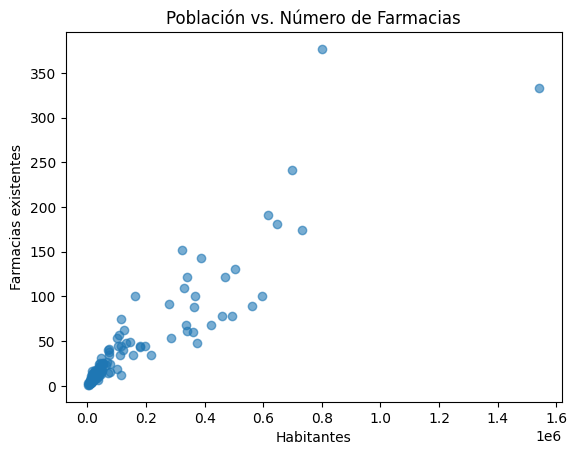

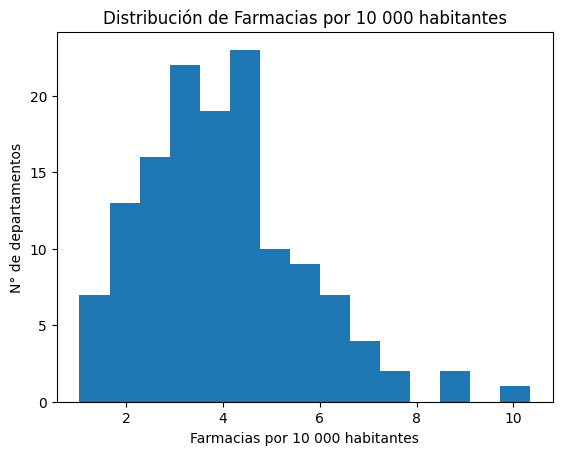

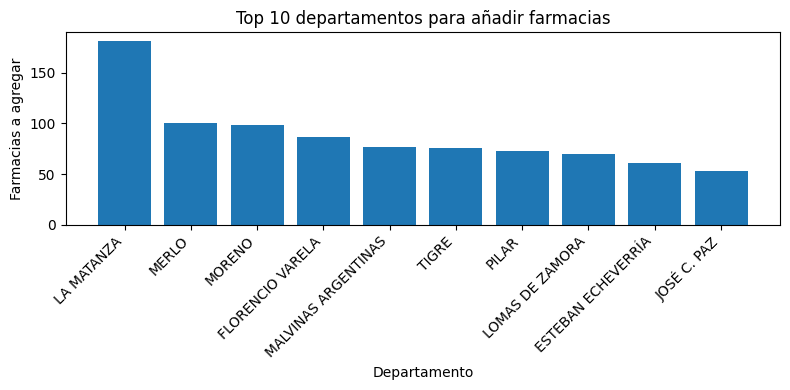

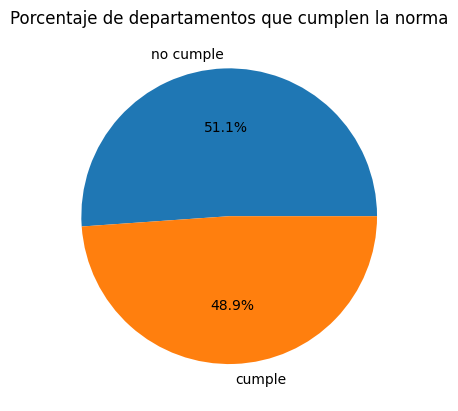

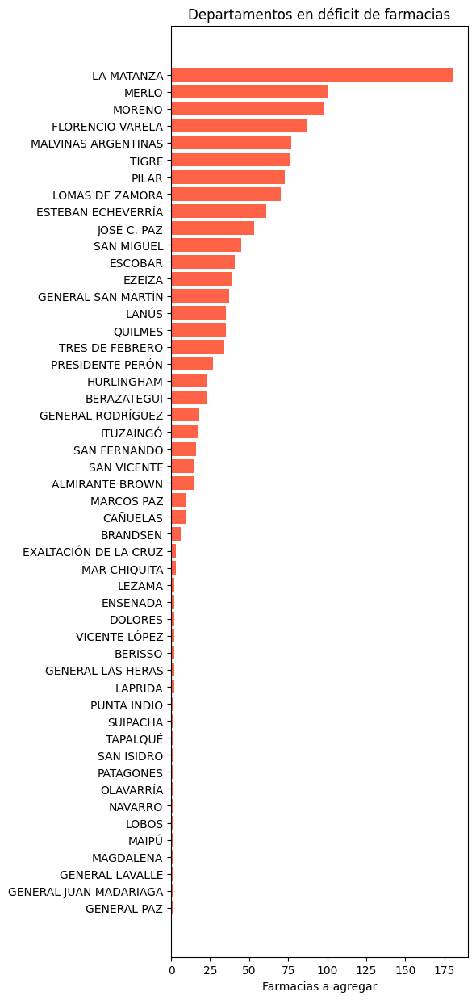

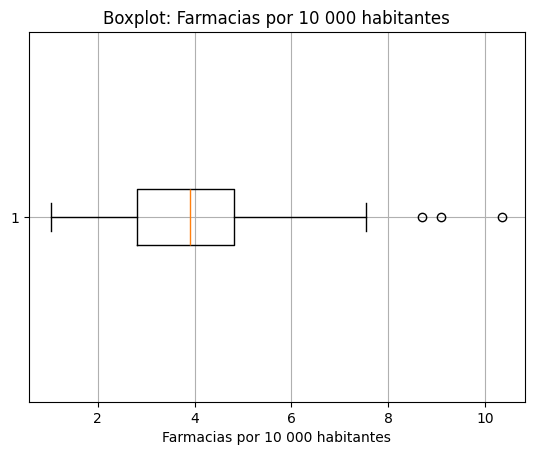


Departamentos con valores atípicos de farmacias por 10.000 habitantes:


,nombre_departamento,habitantes,farmacias,farmacias_por_10000
101,PUÁN,16428,17,10.348186
59,GUAMINÍ,12106,11,9.086403
47,GENERAL GUIDO,3448,3,8.700696


In [ ]:
import os
import logging
import unicodedata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from google.colab import drive

# ───── Configuración de las fuentes de datos ─────
# Archivos .xlsx y .csv almacenados en el repositorio de GitHub

PHARMACY_URL = (
    "https://github.com/Scattered-thunder/"
    "1C2025-CienciaDatos-G2/raw/refs/heads/main/datasets/"
    "establecimientos-farmacias-asentadas-registro-federal-refar-20241227.xlsx"
)

POPULATION_URL = (
    "https://github.com/Scattered-thunder/"
    "1C2025-CienciaDatos-G2/raw/refs/heads/main/datasets/"
    "poblacion_identificada_departamento_enero_2025.csv"
)

# Opcional, comentado porque no es necesario ejecutarlo más de una vez
# Carpeta para guardar resultados en Google Drive
DRIVE_FOLDER_NAME = "colab_results"
OUTPUT_BASE_NAME  = "reporte_farmacias"
drive.mount('/content/drive')

# ───── Parámetros establecidos por la Ley 10.606 ─────
THRESHOLD_ONE     = 4_000
THRESHOLD_TWO     = 6_000
PEOPLE_PER_PHARM  = 3_000

# ───── Configuración de logging ─────
logging.basicConfig(level=logging.INFO, format="%(levelname)s: %(message)s")

# ───── Funciones ─────

def normalize_string(text: str) -> str:
    """Convierte a minúsculas, elimina acentos y espacios en blanco."""
    text = text.lower()
    text = unicodedata.normalize("NFKD", text).encode("ascii", "ignore").decode()
    return text.strip()

def load_pharmacy_data(url: str) -> pd.DataFrame:
    df = pd.read_excel(url)
    df = df[df["PROVINCIA_NOMBRE"].str.upper() == "BUENOS AIRES"]

    df["DEPARTAMENTO_NOMBRE"] = df["DEPARTAMENTO_NOMBRE"].replace({
        "CORONEL DE MARINA L. ROSALES": "CORONEL DE MARINA LEONARDO ROSALES"
    })

    df = (
        df.groupby("DEPARTAMENTO_NOMBRE")
          .size()
          .reset_index(name="farmacias")
          .rename(columns={"DEPARTAMENTO_NOMBRE": "nombre_departamento"})
    )
    return df


def load_population_data(url: str) -> pd.DataFrame:
    # Carga y filtra población solo para Buenos Aires
    df = pd.read_csv(url)
    df = df[df["nombre_provincia"] == "Buenos Aires"]
    df = (
        df.groupby("nombre_departamento")["cantidad"]
          .sum()
          .reset_index(name="total_habitantes")
    )
    logging.info(f"se cargó la población para {len(df)} departamentos de buenos aires")
    return df

def calculate_allowed_pharmacies(pop: int) -> int:
    """
    Aplica la lógica de la Ley 10.606:
      - ≤ 4.000 hab → 1 farmacia
      - entre 4.001 y 5.999 → 2 farmacias
      - ≥ 6.000 → 1 cada 3.000 hab
    """
    if pop <= THRESHOLD_ONE:
        return 1
    if pop < THRESHOLD_TWO:
        return 2
    return int(np.ceil(pop / PEOPLE_PER_PHARM))

def merge_and_evaluate(df_pharm: pd.DataFrame, df_pop: pd.DataFrame) -> pd.DataFrame:
    # Normaliza nombres para hacer el merge correctamente
    df_pharm["key"] = df_pharm["nombre_departamento"].apply(normalize_string)
    df_pop ["key"] = df_pop ["nombre_departamento"].apply(normalize_string)

    # Unión de ambas tablas
    df = pd.merge(df_pharm, df_pop, on="key", how="inner")
    missing = set(df_pharm["key"]) - set(df["key"])
    if missing:
        logging.warning(f"No match for departments: {missing}")

    df = df.drop(columns=["key"])
    df = df.rename(columns={
        "nombre_departamento_x": "nombre_departamento",
        "total_habitantes":      "habitantes"
    })

    # Cálculo de farmacias permitidas y evaluación de cumplimiento
    df["farmacias_permitidas"] = df["habitantes"].apply(calculate_allowed_pharmacies)
    df["cumple_norma"] = np.where(
        df["farmacias"] <= df["farmacias_permitidas"], "cumple", "no cumple"
    )
    df["farmacias_a_agregar"] = (
        df["farmacias_permitidas"] - df["farmacias"]
    ).clip(lower=0)

    # Reordenamiento de columnas
    cols = [
        "nombre_departamento",
        "habitantes",
        "farmacias",
        "farmacias_permitidas",
        "farmacias_a_agregar",
        "cumple_norma",
    ]
    return df[cols]

def plot_graphs(df: pd.DataFrame):
    # 1. Dispersión entre población y farmacias
    plt.figure()
    plt.scatter(df["habitantes"], df["farmacias"], alpha=0.6)
    plt.xlabel("Habitantes")
    plt.ylabel("Farmacias existentes")
    plt.title("Población vs. Número de Farmacias")
    plt.show()

    # 2. Histograma de farmacias por cada 10.000 habitantes
    df["farmacias_por_10000"] = df["farmacias"] / df["habitantes"] * 10000
    plt.figure()
    plt.hist(df["farmacias_por_10000"], bins=15)
    plt.xlabel("Farmacias por 10 000 habitantes")
    plt.ylabel("N° de departamentos")
    plt.title("Distribución de Farmacias por 10 000 habitantes")
    plt.show()

    # 3. Top 10 departamentos con mayor necesidad
    top10 = df.nlargest(10, "farmacias_a_agregar")
    plt.figure(figsize=(8, 4))
    plt.bar(top10["nombre_departamento"], top10["farmacias_a_agregar"])
    plt.xticks(rotation=45, ha="right")
    plt.xlabel("Departamento")
    plt.ylabel("Farmacias a agregar")
    plt.title("Top 10 departamentos para añadir farmacias")
    plt.tight_layout()
    plt.show()

    # 4. Porcentaje de cumplimiento normativo
    counts = df["cumple_norma"].value_counts()
    plt.figure()
    plt.pie(counts, labels=counts.index, autopct="%1.1f%%")
    plt.title("Porcentaje de departamentos que cumplen la norma")
    plt.show()

    # 5. Barras horizontales: todos los departamentos en déficit
    df_deficit = df[df["farmacias_a_agregar"] > 0].sort_values("farmacias_a_agregar", ascending=True)
    plt.figure(figsize=(6, len(df_deficit) * 0.25))
    plt.barh(
        df_deficit["nombre_departamento"],
        df_deficit["farmacias_a_agregar"],
        color="tomato"
    )
    plt.xlabel("Farmacias a agregar")
    plt.title("Departamentos en déficit de farmacias")
    plt.tight_layout()
    plt.show()

    # 6. Boxplot para detectar valores extremos
    plt.figure()
    plt.boxplot(df["farmacias_por_10000"], vert=False)
    plt.title("Boxplot: Farmacias por 10 000 habitantes")
    plt.xlabel("Farmacias por 10 000 habitantes")
    plt.grid(True)
    plt.show()

def main():
    # Carga de datos y evaluación
    df_pharm = load_pharmacy_data(PHARMACY_URL)
    df_pop   = load_population_data(POPULATION_URL)
    df_final = merge_and_evaluate(df_pharm, df_pop)

    # Mostrar top 10 en consola
    logging.info("Top 10 departamentos para agregar farmacias:")
    print(df_final.sort_values("farmacias_a_agregar", ascending=False).head(10))

    # Visualizaciones
    plot_graphs(df_final)

    # Análisis de valores atípicos
    Q1 = df_final["farmacias_por_10000"].quantile(0.25)
    Q3 = df_final["farmacias_por_10000"].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df_final[
        (df_final["farmacias_por_10000"] < lower_bound) |
        (df_final["farmacias_por_10000"] > upper_bound)
    ]

    print("\nDepartamentos con valores atípicos de farmacias por 10.000 habitantes:")
    display(outliers[[
        "nombre_departamento",
        "habitantes",
        "farmacias",
        "farmacias_por_10000"
    ]].sort_values("farmacias_por_10000", ascending=False))

    return df_final

# Ejecutar pipeline y guardar resultado final globalmente
df_final = main()

# OPCIONAL - Comentado para no exportarlo a Google Drive varias veces
output_folder = f"/content/drive/MyDrive/{DRIVE_FOLDER_NAME}"
os.makedirs(output_folder, exist_ok=True)

# Nombres de archivos
csv_path  = os.path.join(output_folder, OUTPUT_BASE_NAME + ".csv")
xlsx_path = os.path.join(output_folder, OUTPUT_BASE_NAME + ".xlsx")

# Exportar resultados
df_final.to_csv(csv_path, index=False, encoding='utf-8')
df_final.to_excel(xlsx_path, index=False)


---

## Gráfico 1: Población vs. Número de Farmacias

**Conclusión:**  
1. Se observa una **relación positiva** entre población y cantidad de farmacias: a mayor número de habitantes, más farmacias.  
2. Sin embargo, hay departamentos muy poblados con **menos farmacias de las que permite la ley**, lo que indica posibles zonas sub-servidas.  
3. También aparecen **outliers** con muchas farmacias en relación con su población (potencial sobredensidad en municipios pequeños).

---

## Gráfico 2: Distribución de Farmacias por cada 10.000 habitantes

**Conclusión:**  
1. La mayoría de los departamentos concentra entre **2 y 8 farmacias por cada 10.000 habitantes**.    
2. Este indicador **normalizado por población** permite comparar cobertura sin depender del tamaño absoluto del departamento.

---

## Gráfico 3: Top 10 departamentos para añadir farmacias

**Conclusión:**  
1. **La Matanza** lidera con cerca de **180 farmacias** adicionales autorizadas según la ley.  
2. Le siguen **Merlo**, **Moreno** y **Florencio Varela**, con entre **85 y 100 farmacias** a agregar.  
3. Estos municipios representan zonas críticas donde **la habilitación de nuevas farmacias debe priorizarse** para alcanzar niveles adecuados de cobertura.

---

## Gráfico 4: Porcentaje de departamentos que cumplen la norma

**Conclusión:**  
1. Aproximadamente el **49 % de los departamentos cumple con la normativa vigente** (es decir, no supera el máximo permitido de farmacias).  
2. El **51 % excede el límite legal**, lo que sugiere una sobredensidad farmacéutica en más de la mitad del territorio.  
3. Para esto se recomienda en caso de los entes regulatoriso, **fortalecer los controles regulatorios** en estas zonas y **orientar futuras habilitaciones hacia los departamentos en déficit**.

In [ ]:
!pip install ydata-profiling
from ydata_profiling import ProfileReport

profile = ProfileReport(
    df_final,
    title="Reporte de Cobertura y Déficit de Farmacias (PBA)",
    explorative=True
)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 7/7 [00:00<00:00, 72.59it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
import unicodedata
import pandas as pd
import requests
import folium
import numpy as np
import branca  # Para la escala de colores (colormap)

# Copiamos el dataframe final procesado
df_map = df_final.copy()

df_map = df_final.copy()
df_map["farmacias_extras"] = (df_map["farmacias"] - df_map["farmacias_permitidas"]).clip(lower=0)

# 1) Función de normalización y creación de clave compuesta "departamento + provincia"
def normalize(text):
    """Elimina acentos, caracteres especiales y estandariza el texto."""
    if pd.isnull(text): return ""
    text = unicodedata.normalize("NFKD", str(text))
    text = "".join(c for c in text if not unicodedata.combining(c))
    text = text.upper().strip()
    text = "".join(c if c.isalnum() or c.isspace() else " " for c in text)
    return " ".join(text.split())

# Se agrega la columna de clave normalizada al dataframe
df_map["dep_norm"]     = df_map["nombre_departamento"].apply(normalize)
df_map["dep_prov_key"] = df_map["dep_norm"] + ", BUENOS AIRES"

# 2) Cargar el GeoJSON y crear la misma clave para poder unir
geojson_url = (
    "https://raw.githubusercontent.com/"
    "mgaitan/departamentos_argentina/refs/heads/master/"
    "departamentos-buenos_aires.json"
)
geo = requests.get(geojson_url).json()

# Generar clave compuesta en cada feature del GeoJSON
for feat in geo["features"]:
    dep  = normalize(feat["properties"].get("departamento",""))
    prov = normalize(feat["properties"].get("provincia",""))
    feat["properties"]["dep_prov_key"] = f"{dep}, {prov}"

# 3) Transferencia de datos del dataframe al GeoJSON
# Creamos un diccionario que asocia claves con las métricas relevantes
lookup = df_map.set_index("dep_prov_key")[
    ["farmacias", "farmacias_permitidas", "farmacias_a_agregar",
     "cumple_norma", "farmacias_extras"]
].to_dict("index")

# Inyectamos esos valores a cada feature del GeoJSON
for feat in geo["features"]:
    p = lookup.get(feat["properties"]["dep_prov_key"], {})
    feat["properties"].update({
        "farmacias":            p.get("farmacias", None),
        "farmacias_permitidas": p.get("farmacias_permitidas", None),
        "farmacias_a_agregar":  p.get("farmacias_a_agregar",  0),
        "cumple_norma":         p.get("cumple_norma",        "sin datos"),
        "farmacias_extras": p.get("farmacias_extras", 0),
    })

# 4) Crear el mapa base centrado en Buenos Aires
m = folium.Map(location=[-34.6, -58.4], zoom_start=8)

# 5) Primera capa: Muestra la cantidad de farmacias que se pueden agregar
# Se define un colormap con colores progresivos rojo → amarillo → verde
vals = df_map["farmacias_a_agregar"]
vmin = max(1, vals[vals>0].min()) if any(vals>0) else 1
vmax = vals.max()
colormap = branca.colormap.LinearColormap(
    ["red", "yellow", "green"],
    vmin=vmin, vmax=vmax,
    caption="Farmacias a agregar"
).add_to(m)

# Estilo de la capa de déficit (colorea según farmacias a agregar)
def style_add(feature):
    n = feature["properties"]["farmacias_a_agregar"]
    if not n or n <= 0:
        return {"fillColor": "lightgray", "color": "gray", "weight": 0.5, "fillOpacity": 0.3}
    return {"fillColor": colormap(n), "color": "gray", "weight": 0.5, "fillOpacity": 0.7}

# Tooltip para mostrar info al pasar el mouse
tooltip = folium.GeoJsonTooltip(
    fields=["departamento", "provincia", "farmacias_a_agregar"],
    aliases=["Depto:", "Prov:", "A agregar:"],
    localize=True
)

# Crear la capa coroplética de déficit
choropleth = folium.GeoJson(
    geo,
    name="Déficit de farmacias",
    style_function=style_add,
    highlight_function=lambda f: {"weight": 2, "color": "black"},
    tooltip=tooltip
)
choropleth.add_to(m)

# 6) Segunda capa: Cumplimiento de la normativa (verde: cumple / rojo: no cumple)
# Se define un color fijo por categoría
color_map_cmp = {"cumple": "green", "no cumple": "red", "sin datos": "lightgray"}

# Función de estilo para cumplimiento
def style_cmp(feature):
    st = feature["properties"].get("cumple_norma", "sin datos")
    return {
        "fillColor": color_map_cmp.get(st, "lightgray"),
        "color":     "gray",
        "weight":    0.5,
        "fillOpacity": 0.7
    }

# Tooltip para cumplimiento normativo
tooltip_cmp = folium.GeoJsonTooltip(
    fields=["departamento", "provincia", "cumple_norma", "farmacias_extras"],
    aliases=["Depto:", "Prov:", "Estado normativa", "Farmacias sobre el límite:"],
    localize=True
)

# Crear y añadir la capa de cumplimiento
fg_cmp = folium.FeatureGroup(name="Cumple normativa")
folium.GeoJson(
    geo,
    name="Cumple normativa",
    style_function=style_cmp,
    highlight_function=lambda f: {"weight": 2, "color": "black"},
    tooltip=tooltip_cmp
).add_to(fg_cmp)
fg_cmp.add_to(m)

# 7) Añadir control de capas y mostrar el mapa
folium.LayerControl(collapsed=False).add_to(m)
m


## Justificación: Por qué no se utilizaron algoritmos de Machine Learning

Este proyecto se desarrolló utilizando un enfoque determinístico basado en reglas de negocio, en lugar de técnicas de Machine Learning (ML). A continuación se detallan las razones técnicas y metodológicas que justifican esta decisión.

### 1. Regla normativa explícita

El objetivo del análisis es verificar el cumplimiento de la Ley Provincial 10.606, que establece de manera clara la cantidad de farmacias habilitables en función de la población de cada departamento.  
No se trata de un problema de inferencia o predicción, sino de una comparación directa entre la realidad observada y el estándar normativo. La salida (`cumple_norma`) es una derivación lógica de una fórmula establecida legalmente.

### 2. Pocas variables explicativas

El modelo se basa en dos únicas variables clave:
- `población` (habitantes por departamento)
- `farmacias` (cantidad actual registrada)

Esta estructura simple, binaria y totalmente definida no justifica el uso de algoritmos de aprendizaje automático, ya que no se dispone de variables adicionales (socioeconómicas, sanitarias, geográficas) que puedan enriquecer un modelo predictivo.

### 3. Ausencia de incertidumbre estructural

El Machine Learning es útil cuando las relaciones entre variables son inciertas o desconocidas.  
En este caso, la relación está completamente determinada por una regla normativa. No hay ambigüedad en los criterios de evaluación ni en el cálculo del cumplimiento.

### 4. Transparencia y auditabilidad

El enfoque actual permite trazabilidad completa: cualquier parte interesada puede entender y replicar el análisis.  
El uso de modelos de ML, especialmente los más complejos, comprometería la explicabilidad, lo que no es adecuado en contextos regulatorios donde la transparencia es prioritaria.

### 5. Falta de datos complementarios

El uso de ML podría considerarse si se contara con variables complementarias como:
- Acceso a servicios de salud
- Distribución geográfica interna de farmacias
- Movilidad entre departamentos
- Condiciones socioeconómicas (ingresos, edad, etc.)

Sin estos datos, añadir complejidad algorítmica no aportaría valor significativo.

### 6. Enfoque descriptivo y normativo

El análisis no busca predecir ni clasificar patrones futuros, sino evaluar situaciones actuales frente a un marco legal.  
Las herramientas utilizadas son estadísticas descriptivas, consultas lógicas y visualizaciones, lo cual es suficiente y apropiado para los fines del proyecto.

### 7. Imposibilidad técnica de aplicar ML supervisado

El aprendizaje supervisado requiere una variable objetivo conocida para entrenar modelos.  
En este caso, no existen etiquetas históricas sobre “cobertura adecuada” ni juicios previos explícitos sobre cumplimiento, lo cual impide definir un `target` válido.

### 8. No aplicabilidad de aprendizaje no supervisado

Las técnicas como clustering o reducción de dimensionalidad no son necesarias: los datos ya están organizados territorial y temporalmente, sin necesidad de descubrir nuevas estructuras latentes.  
El análisis parte de unidades geográficas bien definidas.

### 9. No se cumplen los supuestos fundamentales del ML

Para que el ML sea aplicable se requiere:
- Una hipótesis predictiva o de segmentación
- Suficiente volumen y variedad de datos
- Relación incierta entre variables

Ninguno de estos supuestos está presente.

### Conclusión

La decisión de no utilizar técnicas de Machine Learning es adecuada tanto desde el punto de vista metodológico como técnico.  
El análisis tiene un carácter descriptivo y regulatorio, centrado en contrastar datos observados con normas explícitas.  
Por lo tanto, las herramientas más eficaces son el análisis comparativo, la visualización espacial y las métricas agregadas, sin necesidad de recurrir a modelos predictivos.


## Conclusiones y Hallazgos Clave

El análisis realizado permitió detectar patrones concretos en la distribución territorial de farmacias en la Provincia de Buenos Aires, aplicando criterios objetivos derivados de la Ley 10.606.

A continuación se resumen los principales hallazgos obtenidos:

---

### 1. Alta proporción de departamentos en situación de incumplimiento

Más del **51% de los departamentos** analizados **no cumplen con la normativa vigente** respecto a la cantidad mínima de farmacias permitidas por habitante.  
Esta situación afecta tanto a zonas rurales como semiurbanas, donde la baja densidad de farmacias puede comprometer el acceso al servicio farmacéutico como parte del sistema de salud.

---

### 2. Déficits localizados en zonas con población significativa

Se identificaron **departamentos con poblaciones superiores a 50.000 habitantes** que actualmente cuentan con un número de farmacias inferior al permitido por ley.  
Este hallazgo revela oportunidades claras para mejorar la cobertura sanitaria y corregir desequilibrios en la habilitación territorial.

---

### 3. Posibilidad de habilitar nuevas farmacias bajo marco legal

El análisis permitió calcular cuántas **farmacias adicionales** podrían habilitarse legalmente en cada departamento.  
En algunos casos, se podrían autorizar **más de 5 nuevas farmacias** sin necesidad de modificar la normativa vigente.  
Esto representa una **ventana concreta para la expansión regulada** del servicio farmacéutico.

---

### 4. Inconsistencias entre densidad poblacional y densidad de farmacias

Se observaron casos donde departamentos con alta densidad poblacional presentan una oferta de farmacias inferior a la esperada.  
Este hallazgo refuerza la hipótesis de que **la cantidad absoluta de población no garantiza un cumplimiento normativo**, y que es necesario evaluar cada zona en forma relativa a su población.

---

### 5. Visualización geográfica como herramienta de gestión

El mapa interactivo desarrollado permite **visualizar en tiempo real**:

- Los departamentos en déficit.
- Las zonas que cumplen o no con la ley.
- El número de farmacias que se podrían habilitar en cada caso.

Esta herramienta puede ser utilizada por autoridades sanitarias, municipios, cámaras del sector farmacéutico o entidades académicas como insumo para la toma de decisiones estratégicas.

---

## Recomendaciones Finales

- **Actualizar los padrones oficiales con mayor frecuencia**, especialmente en zonas donde el crecimiento poblacional pueda afectar el cumplimiento normativo.
- **Priorizar acciones regulatorias** en departamentos con alto déficit identificado.
- **Fomentar la instalación de farmacias en zonas críticas**, mediante incentivos o simplificación de trámites, para garantizar una cobertura sanitaria equitativa.
- **Repetir este análisis de forma periódica** como parte de una política de monitoreo activo del sistema de salud provincial.

---

## Cierre

El presente proyecto demuestra cómo, a partir de fuentes públicas y con técnicas de minería de datos accesibles, es posible construir diagnósticos de alto valor agregado sobre la realidad territorial y sanitaria.  
Los resultados obtenidos no solo validan las hipótesis planteadas, sino que abren nuevas líneas de acción en materia de planificación, regulación e inversión en salud pública.



In [ ]:
# Google Sheets para el Looker

!pip install --quiet --upgrade gspread gspread_dataframe oauth2client

import gspread
from gspread_dataframe import set_with_dataframe
from google.colab import auth
from google.auth import default

# Autenticación con Google
auth.authenticate_user()
creds, _ = default()
gc = gspread.authorize(creds)

# nueva Sheet
spreadsheet = gc.create("Reporte Farmacias Buenos Aires")
sheet1 = spreadsheet.get_worksheet(0)

# Export df_final
set_with_dataframe(sheet1, df_final)